A single-link pendulum with torque applied to the pivot point and no friction has the dynamics:
$$ 
\dot{x} = \begin{bmatrix} x_2 \\ - \frac{g}{l} \sin(x_1) \end{bmatrix} + \begin{bmatrix} 0 \\ 1 \end{bmatrix}u
$$ 

I've written a `pendulum.py` function to more easily work with our pendulum system. This function can be used to understand the passive dynamics as well as the pendulum for a given controller. First we will demonstrate how to plot and animate our system without a control law.

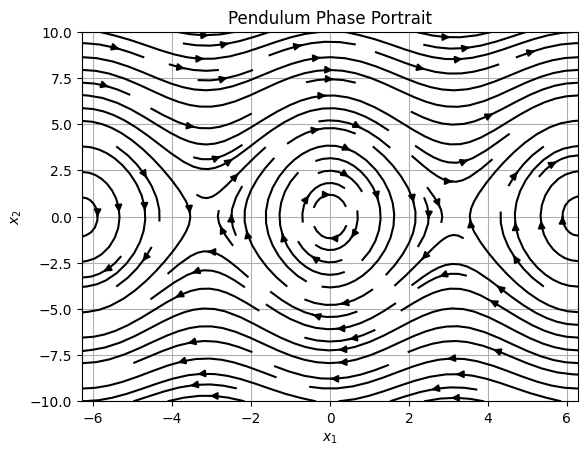

In [3]:
from pendulum import pendulum_system
import numpy as np
from matplotlib import pyplot as plt

def controller(x):
    return 0

# Get the vector field
x = np.linspace(-2*np.pi, 2*np.pi, 400)
y = np.linspace(-10, 10, 400)
X, Y = np.meshgrid(x, y)
U, V = np.zeros(X.shape), np.zeros(Y.shape)
for i in range(X.shape[0]):
    for j in range(X.shape[1]):
        dxdt = pendulum_system([X[i, j], Y[i, j]], 0, controller)
        U[i, j], V[i, j] = dxdt

plt.streamplot(X, Y, U, V, color='k')
plt.xlabel(r'$x_1$')
plt.ylabel(r'$x_2$')
plt.title('Pendulum Phase Portrait')
plt.grid()
plt.show()

We can also use this 'pendulum.py' code to simulate the pendulum

In [13]:
from pendulum import simulate_pendulum, make_animation
from IPython.display import HTML

# Setup
x0 = [-np.pi/2.2, 0]    # initial conditions.
tfinal = 25.0       # Final time. Simulation time = 0 to tfinal.
Nt = 751           # Number of time steps

# Animation
theta_vec, thetadot_vec, dt = simulate_pendulum(x0, tfinal, Nt, controller)
anim = make_animation(dt, theta_vec, thetadot_vec)
plt.close()
HTML(anim.to_jshtml())

We can add a control law to stabilize the pendulum to the upright angle:
$$ u(x,v) = -\sin(x_1) - K_p x_1 - K_d x_2 $$ 
for any $K_p$ and $K_d$ such that the following matrix results in eigenvalues with negative real parts:
$$ A = \begin{bmatrix} 0 & 1 \\ -K_p & -K_d \end{bmatrix} $$


In [14]:
from pendulum import get_params
def controller(x):
    L,g = get_params()
    Kp = 1.0
    Kd = 2.0
    u = g/L*np.sin(x[0]) - Kp*(x[0] - np.pi) - Kd*x[1]
    return u

# Animation
theta_vec, thetadot_vec, dt = simulate_pendulum(x0, tfinal, Nt, controller)
anim = make_animation(dt, theta_vec, thetadot_vec)
plt.close()
HTML(anim.to_jshtml())